In [2]:
!pip install -q --upgrade git+https://github.com/huggingface/transformers.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 100.3 MB/s eta 0:00:00


In [4]:
from IPython.display import clear_output
from google.colab import files
files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d xinmengchen/wider-data
!unzip wider-data.zip
!rm wider-data.zip
clear_output()

In [3]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

import torch
from transformers import CLIPProcessor, CLIPModel
from transformers import SamModel, SamProcessor

In [8]:
root = "WIDER/"

def read_annots(file, max_faces=20):
    def get_coords(line):
        coor = line.split(" ")
        xywh = [int(coor[i]) for i in range(4)] if(len(coor) > 4) else None
        return xywh
    
    data = []
    
    with open(file, "r") as f:
        lines = f.readlines()
        for i, line in enumerate(lines):
            if ".jpg" in line:
                annot = {
                    "path": line.strip(),
                    "box_num": int(lines[i+1]),
                    "boxes": [],
                    "label": [],
                }
                if max_faces >= annot["box_num"]:
                    for j in range(annot["box_num"]):
                        box = get_coords(lines[i+2+j].replace("\n", ""))
                        if box is not None:
                            x,y,w,h = box
                            
                            # xmin, ymin, xmax, ymax
                            box = [x, y, x+w, y+h]
                            annot["boxes"].append(box)
                            annot["label"].append(0)  # 1
                    if len(annot["boxes"]) > 0:
                        data.append(annot)
    return data

In [9]:
test = read_annots("WIDER/wider_face_val_bbx_gt.txt")

In [11]:
data = pd.DataFrame.from_records(test, columns=list(test[0].keys())).explode("boxes").reset_index(drop=True)
train_points = pd.DataFrame(data["boxes"].values.tolist(), columns=["xmin", "ymin", "xmax", "ymax"], index=data.index)
data = pd.concat([data, train_points], axis=1)
data = data[~((data.xmin == data.xmax) | (data.ymin == data.ymax))]
data["class_id"] = 0
image_ids = {p: i for i, p in enumerate(data["path"].unique())}
data["image_id"] = data["path"].map(image_ids)

data.head()

,path,box_num,boxes,label,xmin,ymin,xmax,ymax,class_id,image_id
0,0--Parade/0_Parade_Parade_0_194.jpg,5,"[111, 425, 233, 552]","[0, 0, 0, 0, 0]",111,425,233,552,0,0
1,0--Parade/0_Parade_Parade_0_194.jpg,5,"[209, 347, 279, 450]","[0, 0, 0, 0, 0]",209,347,279,450,0,0
2,0--Parade/0_Parade_Parade_0_194.jpg,5,"[368, 252, 457, 385]","[0, 0, 0, 0, 0]",368,252,457,385,0,0
3,0--Parade/0_Parade_Parade_0_194.jpg,5,"[555, 282, 644, 382]","[0, 0, 0, 0, 0]",555,282,644,382,0,0
4,0--Parade/0_Parade_Parade_0_194.jpg,5,"[707, 252, 799, 385]","[0, 0, 0, 0, 0]",707,252,799,385,0,0


In [12]:
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

In [13]:
device = "cuda" if torch.cuda.is_available() else "cpu"
sam_model = SamModel.from_pretrained("facebook/sam-vit-huge").to(device)
sam_processor = SamProcessor.from_pretrained("facebook/sam-vit-huge")

In [14]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))  

def show_boxes_on_image(raw_image, boxes):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    for box in boxes:
      show_box(box, plt.gca())
    plt.axis('on')
    plt.show()

def show_points_on_image(raw_image, input_points, input_labels=None):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    input_points = np.array(input_points)
    if input_labels is None:
      labels = np.ones_like(input_points[:, 0])
    else:
      labels = np.array(input_labels)
    show_points(input_points, labels, plt.gca())
    plt.axis('on')
    plt.show()


def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_points_and_boxes_on_image(raw_image, boxes, input_points, input_labels=None):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    input_points = np.array(input_points)
    if input_labels is None:
      labels = np.ones_like(input_points[:, 0])
    else:
      labels = np.array(input_labels)
    show_points(input_points, labels, plt.gca())
    for box in boxes:
      show_box(box, plt.gca())
    plt.axis('on')
    plt.show()


def show_points_and_boxes_on_image(raw_image, boxes, input_points, input_labels=None):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    input_points = np.array(input_points)
    if input_labels is None:
      labels = np.ones_like(input_points[:, 0])
    else:
      labels = np.array(input_labels)
    show_points(input_points, labels, plt.gca())
    for box in boxes:
      show_box(box, plt.gca())
    plt.axis('on')
    plt.show()


def show_masks_on_image(raw_image, masks, scores):
    if len(masks.shape) == 4:
      masks = masks.squeeze()
    if scores.shape[0] == 1:
      scores = scores.squeeze()

    nb_predictions = scores.shape[-1]
    fig, axes = plt.subplots(1, nb_predictions, figsize=(15, 15))

    for i, (mask, score) in enumerate(zip(masks, scores)):
      mask = mask.cpu().detach()
      axes[i].imshow(np.array(raw_image))
      show_mask(mask, axes[i])
      axes[i].title.set_text(f"Mask {i+1}, Score: {score.item():.3f}")
      axes[i].axis("off")
    plt.show()

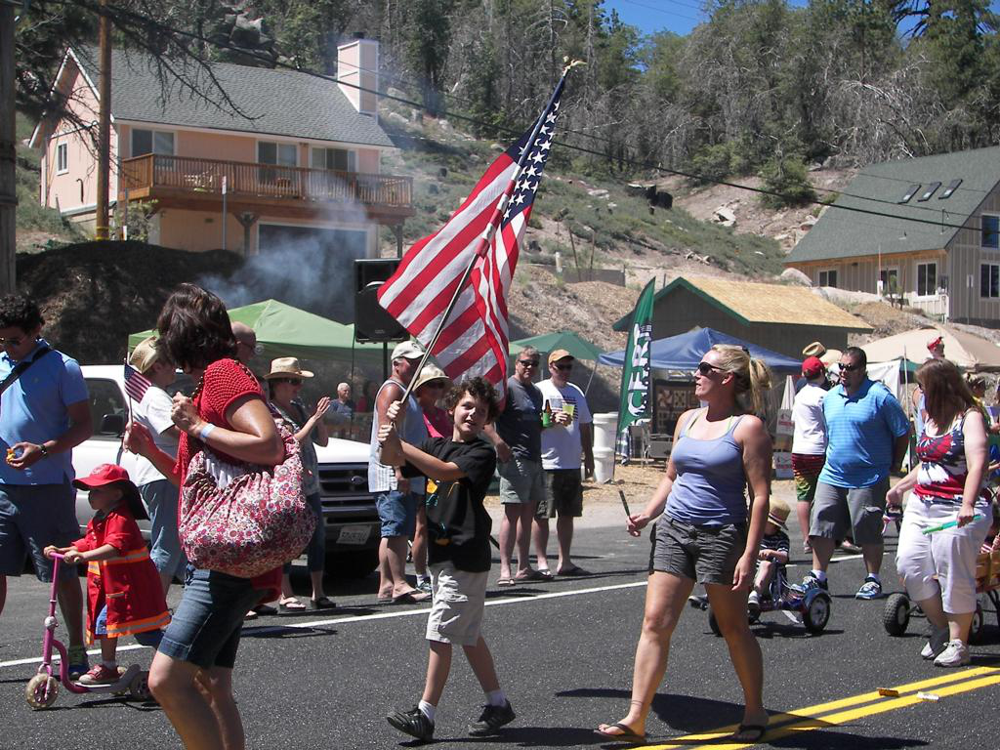

In [15]:
idx = np.random.randint(len(data))
image = Image.open("WIDER/WIDER_val/" + data["path"].iloc[idx]).convert("RGB")
image

In [16]:
inputs = sam_processor(image, return_tensors="pt").to(device)
image_embeddings = sam_model.get_image_embeddings(inputs["pixel_values"])

In [17]:
image_embeddings.shape

torch.Size([1, 256, 64, 64])

In [90]:
names = data.loc[idx, "path"]
input_points = data.loc[data["path"] == names, ["xmin", "ymin", "xmax", "ymax"]].values

In [91]:
input_points = np.hstack([input_points[:, [0, 2]].mean(axis=1).astype(int).reshape(-1,1), input_points[:, [1, 3]].mean(axis=1).astype(int).reshape(-1,1)])

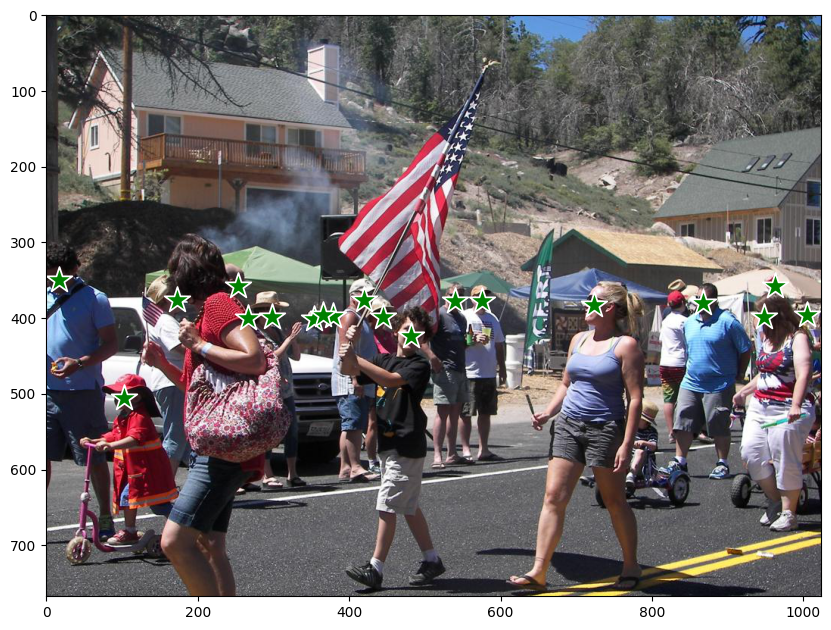

In [93]:
show_points_on_image(image, input_points)

In [100]:
input_points = input_points.astype(float)[None, ...].tolist()

In [98]:
inputs = sam_processor(image, input_points=input_points, return_tensors="pt").to(device)
# pop the pixel_values as they are not neded
inputs.pop("pixel_values", None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
    outputs = sam_model(**inputs)

masks = sam_processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
scores = outputs.iou_scores

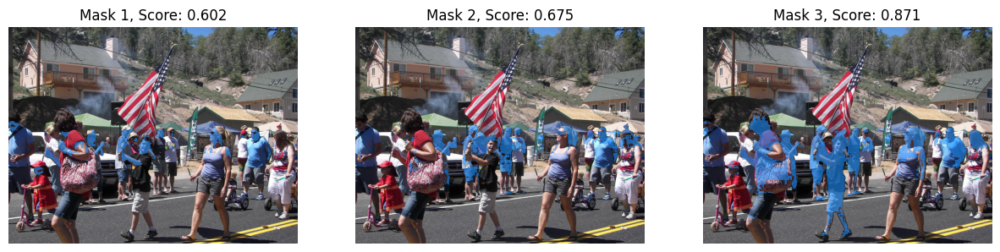

In [99]:
show_masks_on_image(image, masks[0], scores)

In [103]:
input_boxes = data.loc[data["path"] == names, ["xmin", "ymin", "xmax", "ymax"]].values.tolist()

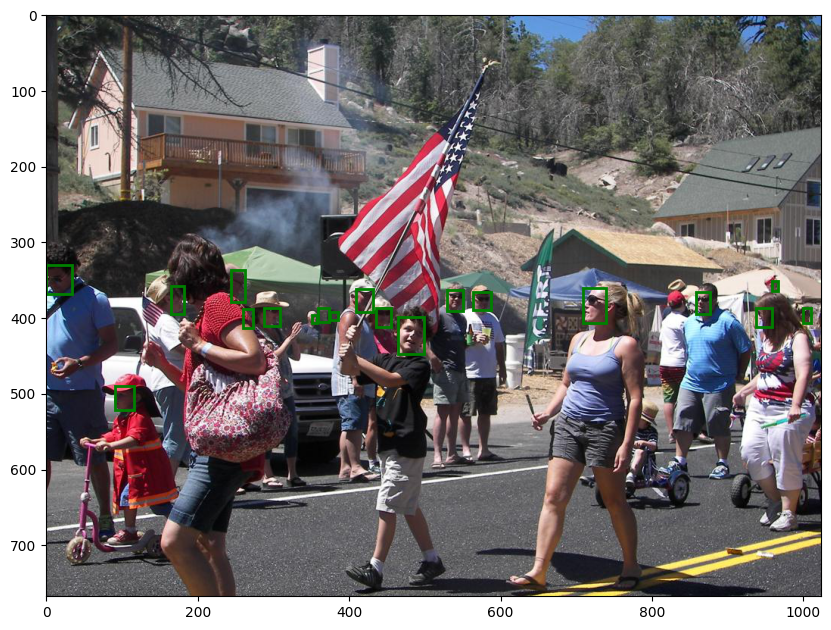

In [105]:
show_boxes_on_image(image, input_boxes) 

In [116]:
inputs = sam_processor(image, input_boxes=[input_boxes[10]], return_tensors="pt").to(device)

inputs.pop("pixel_values", None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
    outputs = sam_model(**inputs)

masks = sam_processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
scores = outputs.iou_scores

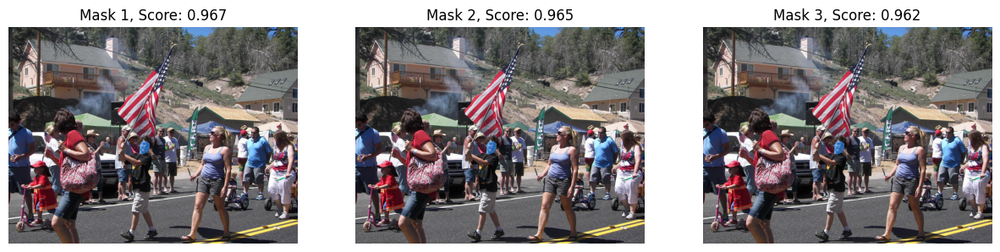

In [117]:
show_masks_on_image(image, masks[0], scores)

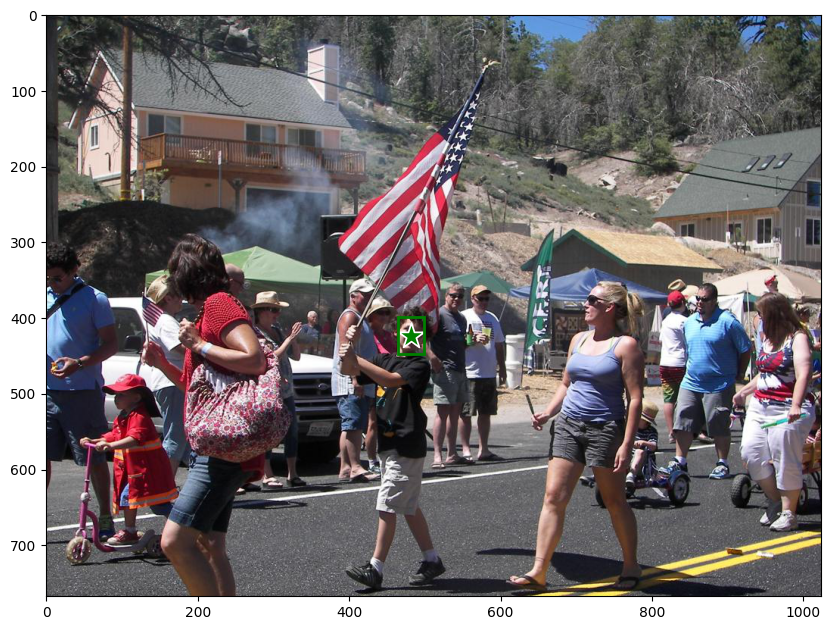

In [124]:
show_points_and_boxes_on_image(image, [input_boxes[10]], [input_points[0][10]])

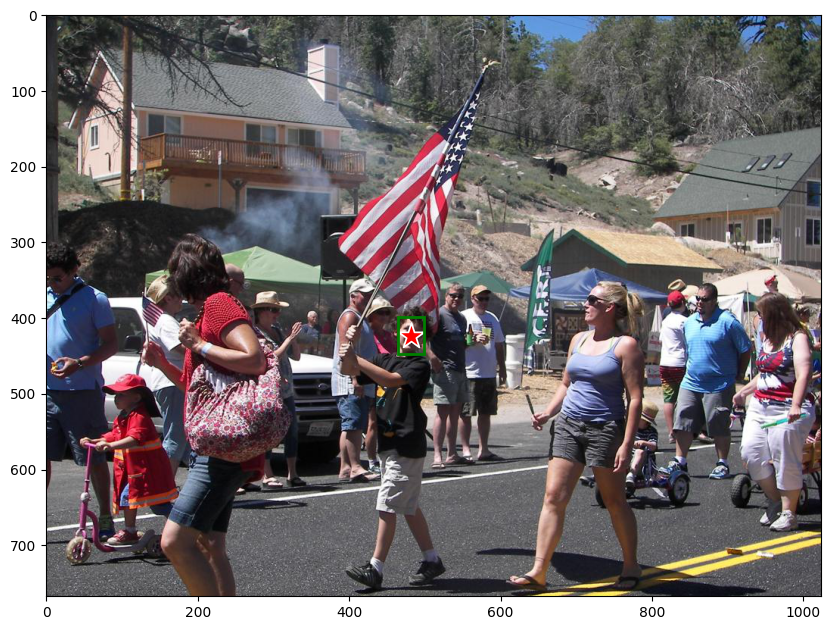

In [135]:
show_points_and_boxes_on_image(image, [input_boxes[10]], [input_points[0][10]], [0])

In [138]:
labels = [[0]]

In [148]:
inputs = sam_processor(image, input_boxes=[[input_boxes[10]]], input_points=[[input_points[0][10]]], input_labels=[labels], return_tensors="pt").to(device)

inputs.pop("pixel_values", None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
    outputs = sam_model(**inputs)

masks = sam_processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
scores = outputs.iou_scores

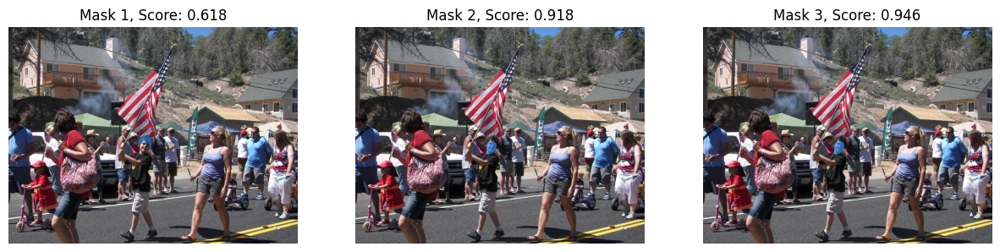

In [149]:
show_masks_on_image(image, masks[0][0], scores[:, 0, :])

In [151]:
inputs = sam_processor(image, input_points=[input_points], return_tensors="pt").to(device)

In [153]:
inputs.pop("pixel_values", None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
    outputs = sam_model(**inputs)

masks = sam_processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
scores = outputs.iou_scores

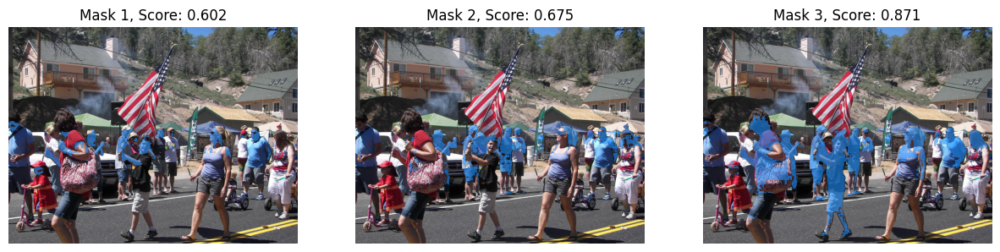

In [155]:
show_masks_on_image(image, masks[0][0], scores[:, 0, :])

In [171]:
inputs = sam_processor(image, input_boxes=[input_boxes[:4]], return_tensors="pt").to(device)

inputs.pop("pixel_values", None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
    outputs = sam_model(**inputs, multimask_output=False)

masks = sam_processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
scores = outputs.iou_scores

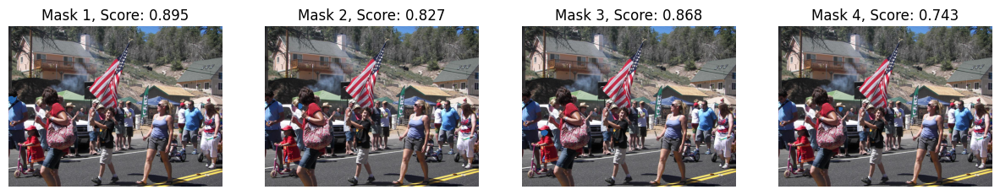

In [172]:
show_masks_on_image(image, masks[0], scores)

In [173]:
# text prompt input is not available by the time of running script, experiment with clip

inputs = clip_processor(text=["a photo of human face"], images=image, return_tensors="pt", padding=True)

outputs = clip_model(**inputs)

In [177]:
outputs.text_embeds.shape, image_embeddings.shape

(torch.Size([1, 512]), torch.Size([1, 256, 64, 64]))

In [178]:
image.size

(1024, 768)

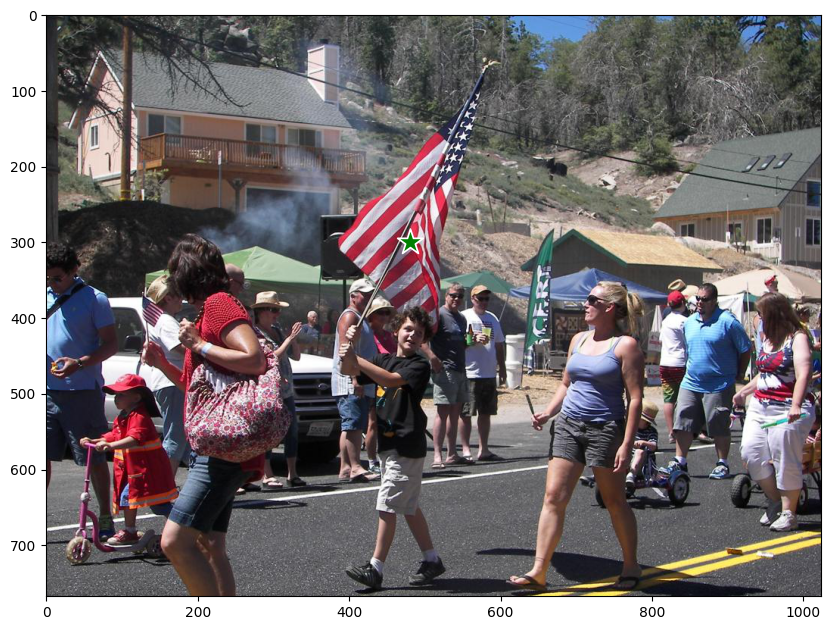

In [185]:
input_points = [[480, 300]]
show_points_on_image(image, input_points)

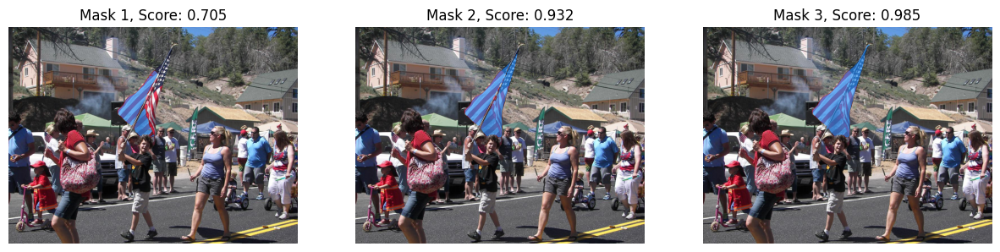

In [186]:
inputs = sam_processor(image, input_points=[input_points], return_tensors="pt").to(device)
# pop the pixel_values as they are not neded
inputs.pop("pixel_values", None)
inputs.update({"image_embeddings": image_embeddings})

with torch.no_grad():
    outputs = sam_model(**inputs)

masks = sam_processor.image_processor.post_process_masks(outputs.pred_masks.cpu(), inputs["original_sizes"].cpu(), inputs["reshaped_input_sizes"].cpu())
scores = outputs.iou_scores

show_masks_on_image(image, masks[0], scores)  
# model update (linear combination of focal and dice losses) was computed only on output mask with highest loss (given 3 losses from 3 masks)